<a href="https://colab.research.google.com/github/LaraAlves22/TCC/blob/main/TCC_HAM10000.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. INSTALAÇÃO DE DEPENDÊNCIAS

In [ ]:
import sys, importlib

# Kaggle para download do dataset
!pip install -q kaggle

# Hugging Face transformers para o ViT skin-specific
!pip install -q transformers

!pip install -q timm torchcam scikit-learn seaborn

# Verifica se numpy está na versão certa; se não, instala e reinicia
try:
    import numpy as np
    assert np.__version__.startswith("1.26"), "versão errada"
except Exception:
    !pip install -q numpy==1.26.4
    print("\n⚠️  Numpy atualizado. Reinicie o runtime agora:")
    print("   Menu → Runtime → Restart runtime")
    print("   Depois rode as próximas células normalmente.\n")
    import os
    os.kill(os.getpid(), 9)

import torch
import torchvision
import numpy as np
print("Torch:", torch.__version__)
print("Torchvision:", torchvision.__version__)
print("Numpy:", np.__version__)

Torch: 2.11.0+cu128
Torchvision: 0.26.0+cu128
Numpy: 1.26.4


# 2. IMPORTS

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, WeightedRandomSampler
from torchcam.methods import GradCAM

import timm
from transformers import ViTForImageClassification
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
import shutil
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import pandas as pd

# 3. DOWNLOAD DO DATASET VIA KAGGLE API

> **Pré-requisito:** Faça login no [kaggle.com](https://www.kaggle.com) → Settings → API → *Create New Token*.
> Isso baixa o `kaggle.json`. Aceite também os termos do dataset em:
> https://www.kaggle.com/datasets/kmader/skin-lesion-analysis-toward-melanoma-detection

In [ ]:
import kagglehub
import os

# Download do HAM10000
path = kagglehub.dataset_download("kmader/skin-cancer-mnist-ham10000")
print("Path retornado:", path)
print("\nEstrutura do dataset:")
for root, dirs, files in os.walk(path):
    level = root.replace(path, '').count(os.sep)
    if level <= 2:
        print('  ' * level + os.path.basename(root) + '/')
        for f in files[:3]:  # mostra até 3 arquivos por pasta
            print('  ' * (level+1) + f)

# Detecta automaticamente onde está o metadata.csv
csv_candidates = []
for root, dirs, files in os.walk(path):
    for f in files:
        if f == 'HAM10000_metadata.csv':
            csv_candidates.append(root)

base_path = csv_candidates[0] if csv_candidates else path
print(f"\nbase_path definido como: {base_path}")

# Google Drive
from google.colab import drive
drive.mount("/content/drive")
SAVE_DIR = "/content/drive/MyDrive/tcc_resultados4"
os.makedirs(SAVE_DIR, exist_ok=True)
print(f"Resultados serão salvos em: {SAVE_DIR}")

Using Colab cache for faster access to the 'skin-cancer-mnist-ham10000' dataset.
Path retornado: /kaggle/input/skin-cancer-mnist-ham10000

Estrutura do dataset:
skin-cancer-mnist-ham10000/
  hmnist_8_8_RGB.csv
  hmnist_28_28_RGB.csv
  hmnist_8_8_L.csv
  HAM10000_images_part_1/
    ISIC_0028933.jpg
    ISIC_0028394.jpg
    ISIC_0027799.jpg
  ham10000_images_part_1/
    ISIC_0028933.jpg
    ISIC_0028394.jpg
    ISIC_0027799.jpg
  HAM10000_images_part_2/
    ISIC_0030912.jpg
    ISIC_0030585.jpg
    ISIC_0033697.jpg
  ham10000_images_part_2/
    ISIC_0030912.jpg
    ISIC_0030585.jpg
    ISIC_0033697.jpg

base_path definido como: /kaggle/input/skin-cancer-mnist-ham10000
Mounted at /content/drive
Resultados serão salvos em: /content/drive/MyDrive/tcc_resultados4


# 4. ORGANIZAR IMAGENS POR CLASSE

In [ ]:
import shutil

# base_path = onde o kagglehub baixou (read-only)
# work_path = onde vamos trabalhar (gravável)
work_path = "/content/dataset"
os.makedirs(work_path, exist_ok=True)

df = pd.read_csv(f"{base_path}/HAM10000_metadata.csv")
print("Classes:", df['dx'].unique())
print("Distribuição:\n", df['dx'].value_counts())

for label in df['dx'].unique():
    os.makedirs(f"{work_path}/organized/{label}", exist_ok=True)

for _, row in df.iterrows():
    img_id = row['image_id']
    label  = row['dx']
    for folder in ["HAM10000_images_part_1", "HAM10000_images_part_2"]:
        src = f"{base_path}/{folder}/{img_id}.jpg"
        if os.path.exists(src):
            dst = f"{work_path}/organized/{label}/{img_id}.jpg"
            shutil.copy(src, dst)
            break

# Atualiza base_path para o diretório gravável
base_path = work_path
print(f"\nImagens organizadas em: {base_path}/organized")

Classes: ['bkl' 'nv' 'df' 'mel' 'vasc' 'bcc' 'akiec']
Distribuição:
 dx
nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64

Imagens organizadas em: /content/dataset/organized


# 5. SPLIT TREINO / VALIDAÇÃO

In [ ]:
train_dir = f"{base_path}/train"
val_dir   = f"{base_path}/val"

for label in os.listdir(f"{base_path}/organized"):
    imgs = os.listdir(f"{base_path}/organized/{label}")
    train_imgs, val_imgs = train_test_split(imgs, test_size=0.2, random_state=42)

    os.makedirs(f"{train_dir}/{label}", exist_ok=True)
    os.makedirs(f"{val_dir}/{label}",   exist_ok=True)

    for img in train_imgs:
        shutil.copy(f"{base_path}/organized/{label}/{img}", f"{train_dir}/{label}/{img}")
    for img in val_imgs:
        shutil.copy(f"{base_path}/organized/{label}/{img}", f"{val_dir}/{label}/{img}")

# 6. TRANSFORMS COM NORMALIZAÇÃO IMAGENET

In [ ]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

# 7. DATASETS E DATALOADERS COM BALANCEAMENTO

In [ ]:
train_dataset = datasets.ImageFolder(train_dir, transform=transform_train)
val_dataset   = datasets.ImageFolder(val_dir,   transform=transform_val)

# WeightedRandomSampler para lidar com desbalanceamento do HAM10000
class_counts   = np.array([len(os.listdir(f"{train_dir}/{c}")) for c in train_dataset.classes])
class_weights  = 1.0 / class_counts
sample_weights = [class_weights[label] for _, label in train_dataset.samples]
sampler = WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)

train_loader = DataLoader(train_dataset, batch_size=16, sampler=sampler)
val_loader   = DataLoader(val_dataset,   batch_size=16, shuffle=False)

num_classes = len(train_dataset.classes)
print("Classes:", train_dataset.classes)
print("Num classes:", num_classes)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Classes: ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
Num classes: 7
Device: cuda


# 8. MODELOS

## DenseNet201 (CNN) — igual ao original

## ViT — pré-treinado em lesões de pele (ISIC/HAM10000)
Usamos o modelo **`Anwarkh1/Skin_Cancer-Image_Classification`** do Hugging Face,
um ViT-B/16 fine-tunado especificamente no dataset ISIC de câncer de pele.
A head de classificação é substituída para 7 classes do HAM10000.

In [ ]:
# ── DenseNet201 (CNN) ─────────────────────────────────────────────────────
model_cnn = models.densenet201(pretrained=True)
model_cnn.classifier = nn.Linear(model_cnn.classifier.in_features, num_classes)
model_cnn = model_cnn.to(device)

# ── ViT pré-treinado em imagens de pele (Hugging Face) ────────────────────
# Modelo: ViT fine-tunado no dataset ISIC de lesões de pele
# Repo: https://huggingface.co/Anwarkh1/Skin_Cancer-Image_Classification
HF_SKIN_MODEL = "Anwarkh1/Skin_Cancer-Image_Classification"

model_vit_hf = ViTForImageClassification.from_pretrained(
    HF_SKIN_MODEL,
    num_labels=num_classes,
    ignore_mismatched_sizes=True,  # permite trocar a head para 7 classes
    attn_implementation="eager"
)
model_vit_hf = model_vit_hf.to(device)

# Wrapper para que o pipeline de treino/avaliação seja idêntico ao original
# (o HF model retorna um objeto SequenceClassifierOutput, não um tensor direto)
class ViTSkinWrapper(nn.Module):
    def __init__(self, hf_model):
        super().__init__()
        self.model = hf_model
        self.config = hf_model.config

    def forward(self, x):
        return self.model(pixel_values=x).logits

model_vit = ViTSkinWrapper(model_vit_hf).to(device)

print("✅ DenseNet201 e ViT (skin-pretrained) carregados.")
print(f"   Parâmetros ViT: {sum(p.numel() for p in model_vit.parameters()):,}")

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to /root/.cache/torch/hub/checkpoints/densenet201-c1103571.pth


100%|██████████| 77.4M/77.4M [00:00<00:00, 158MB/s]
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/343M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

✅ DenseNet201 e ViT (skin-pretrained) carregados.
   Parâmetros ViT: 85,804,039


### 8b. Adaptador do Attention Rollout para o modelo HuggingFace
O hook de atenção precisa ser registrado nos blocos internos do ViT HF,
que têm estrutura ligeiramente diferente do `timm`.

In [ ]:
def get_attention_rollout(model_vit_wrapper, input_tensor):
    hf_model = model_vit_wrapper.model
    hf_model.eval()

    hf_model.config._attn_implementation = "eager"
    # Força o modelo a retornar attention weights
    hf_model.config.output_attentions = True

    with torch.no_grad():
        outputs = hf_model(
            pixel_values=input_tensor,
            output_attentions=True
        )

    logits     = outputs.logits
    attentions = outputs.attentions

    if attentions is None:
        raise ValueError("Modelo não retornou attentions. Verifique a arquitetura.")

    rollout = None
    for attn in attentions:
        attn_mean = attn[0].mean(dim=0)                          # (N, N)
        attn_res  = attn_mean + torch.eye(attn_mean.size(0), device=attn_mean.device)
        attn_res  = attn_res / attn_res.sum(dim=-1, keepdim=True)

        if rollout is None:
            rollout = attn_res
        else:
            rollout = attn_res @ rollout

    # Token [CLS] → patches
    mask = rollout[0, 1:].cpu().numpy()
    size = int(np.sqrt(mask.shape[0]))
    mask = mask.reshape(size, size)
    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)

    return logits, mask

# 9. FUNÇÕES DE TREINO E AVALIAÇÃO

In [ ]:
def train_epoch(model, loader, optimizer, criterion):
    model.train()
    total_loss = 0
    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)


def evaluate(model, loader):
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    all_preds  = np.array(all_preds)
    all_labels = np.array(all_labels)
    acc = (all_preds == all_labels).mean()
    return acc, all_preds, all_labels


def save_metrics(all_labels, all_preds, class_names, model_name):
    report = classification_report(all_labels, all_preds, target_names=class_names)
    print(f"\n=== {model_name} - Métricas por Classe ===")
    print(report)

    txt_path = f"{SAVE_DIR}/metricas_{model_name.replace(' ', '_')}.txt"
    with open(txt_path, "w") as f:
        f.write(f"=== {model_name} ===\n\n")
        f.write(report)
    print(f"Métricas salvas em: {txt_path}")

    report_dict = classification_report(all_labels, all_preds, target_names=class_names, output_dict=True)
    df_report   = pd.DataFrame(report_dict).transpose()
    csv_path    = f"{SAVE_DIR}/metricas_{model_name.replace(' ', '_')}.csv"
    df_report.to_csv(csv_path)
    print(f"Métricas CSV salvas em: {csv_path}")

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(9, 7))
    sns.heatmap(cm, annot=True, fmt='d',
                xticklabels=class_names,
                yticklabels=class_names,
                cmap='Blues')
    plt.title(f"Matriz de Confusão — {model_name}")
    plt.ylabel("Real")
    plt.xlabel("Predito")
    plt.tight_layout()
    cm_path = f"{SAVE_DIR}/confusao_{model_name.replace(' ', '_')}.png"
    plt.savefig(cm_path, dpi=150)
    plt.show()
    print(f"Matriz de confusão salva em: {cm_path}")

# 10. TREINAMENTO

In [ ]:
criterion     = nn.CrossEntropyLoss()
optimizer_cnn = optim.Adam(model_cnn.parameters(), lr=1e-4)

# ViT skin-pretrained: taxa de aprendizado menor para não destruir o pré-treinamento
optimizer_vit = optim.Adam(model_vit.parameters(), lr=5e-5)

epochs = 10

history = {
    "cnn_loss": [], "cnn_acc": [],
    "vit_loss": [], "vit_acc": [],
}

for epoch in range(epochs):
    loss_cnn = train_epoch(model_cnn, train_loader, optimizer_cnn, criterion)
    acc_cnn, _, _ = evaluate(model_cnn, val_loader)

    loss_vit = train_epoch(model_vit, train_loader, optimizer_vit, criterion)
    acc_vit, _, _ = evaluate(model_vit, val_loader)

    history["cnn_loss"].append(loss_cnn)
    history["cnn_acc"].append(acc_cnn)
    history["vit_loss"].append(loss_vit)
    history["vit_acc"].append(acc_vit)

    print(f"\nEpoch {epoch+1}/{epochs}")
    print(f"  CNN - Loss: {loss_cnn:.4f} | Acc: {acc_cnn:.4f}")
    print(f"  ViT - Loss: {loss_vit:.4f} | Acc: {acc_vit:.4f}")

    torch.save(model_cnn.state_dict(), f"{SAVE_DIR}/model_cnn_epoch{epoch+1}.pth")
    torch.save(model_vit.state_dict(), f"{SAVE_DIR}/model_vit_epoch{epoch+1}.pth")

df_history = pd.DataFrame(history)
df_history.index.name = "epoch"
history_path = f"{SAVE_DIR}/historico_treino.csv"
df_history.to_csv(history_path)
print(f"\nHistórico de treino salvo em: {history_path}")


Epoch 1/10
  CNN - Loss: 0.7309 | Acc: 0.7212
  ViT - Loss: 0.7888 | Acc: 0.7357

Epoch 2/10
  CNN - Loss: 0.4390 | Acc: 0.7746
  ViT - Loss: 0.2707 | Acc: 0.9337

Epoch 3/10
  CNN - Loss: 0.3132 | Acc: 0.7860
  ViT - Loss: 0.1853 | Acc: 0.8983

Epoch 4/10
  CNN - Loss: 0.2781 | Acc: 0.7950
  ViT - Loss: 0.1442 | Acc: 0.9317

Epoch 5/10
  CNN - Loss: 0.2326 | Acc: 0.8424
  ViT - Loss: 0.1169 | Acc: 0.9546

Epoch 6/10
  CNN - Loss: 0.2174 | Acc: 0.8489
  ViT - Loss: 0.1043 | Acc: 0.9421

Epoch 7/10
  CNN - Loss: 0.1914 | Acc: 0.8379
  ViT - Loss: 0.0874 | Acc: 0.9576

Epoch 8/10
  CNN - Loss: 0.1814 | Acc: 0.8484
  ViT - Loss: 0.0805 | Acc: 0.9342

Epoch 9/10
  CNN - Loss: 0.1541 | Acc: 0.8409
  ViT - Loss: 0.0748 | Acc: 0.9421

Epoch 10/10
  CNN - Loss: 0.1464 | Acc: 0.8459
  ViT - Loss: 0.0674 | Acc: 0.9377

Histórico de treino salvo em: /content/drive/MyDrive/tcc_resultados4/historico_treino.csv


# 11. MÉTRICAS FINAIS (F1, SENSIBILIDADE, ETC.)


=== DenseNet201 CNN - Métricas por Classe ===
              precision    recall  f1-score   support

       akiec       0.58      0.74      0.65        66
         bcc       0.70      0.83      0.76       103
         bkl       0.74      0.69      0.71       220
          df       0.72      0.78      0.75        23
         mel       0.59      0.77      0.67       223
          nv       0.96      0.89      0.92      1341
        vasc       0.83      1.00      0.91        29

    accuracy                           0.85      2005
   macro avg       0.73      0.81      0.77      2005
weighted avg       0.86      0.85      0.85      2005

Métricas salvas em: /content/drive/MyDrive/tcc_resultados4/metricas_DenseNet201_CNN.txt
Métricas CSV salvas em: /content/drive/MyDrive/tcc_resultados4/metricas_DenseNet201_CNN.csv


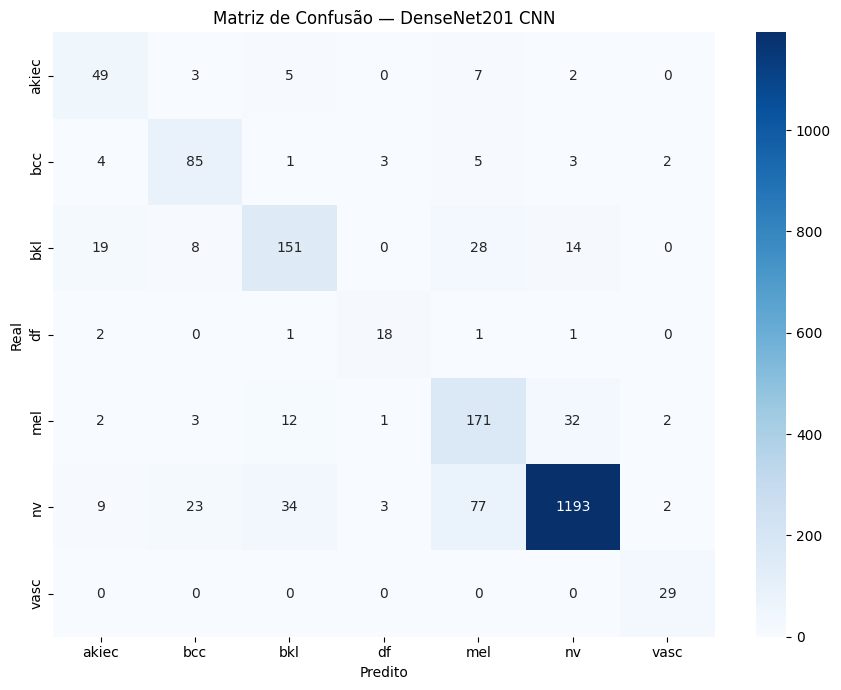

Matriz de confusão salva em: /content/drive/MyDrive/tcc_resultados4/confusao_DenseNet201_CNN.png

=== ViT Skin Pretrained - Métricas por Classe ===
              precision    recall  f1-score   support

       akiec       0.85      0.83      0.84        66
         bcc       0.93      0.94      0.94       103
         bkl       0.95      0.83      0.88       220
          df       0.92      0.96      0.94        23
         mel       0.74      0.98      0.84       223
          nv       0.99      0.95      0.97      1341
        vasc       0.96      0.93      0.95        29

    accuracy                           0.94      2005
   macro avg       0.90      0.92      0.91      2005
weighted avg       0.95      0.94      0.94      2005

Métricas salvas em: /content/drive/MyDrive/tcc_resultados4/metricas_ViT_Skin_Pretrained.txt
Métricas CSV salvas em: /content/drive/MyDrive/tcc_resultados4/metricas_ViT_Skin_Pretrained.csv


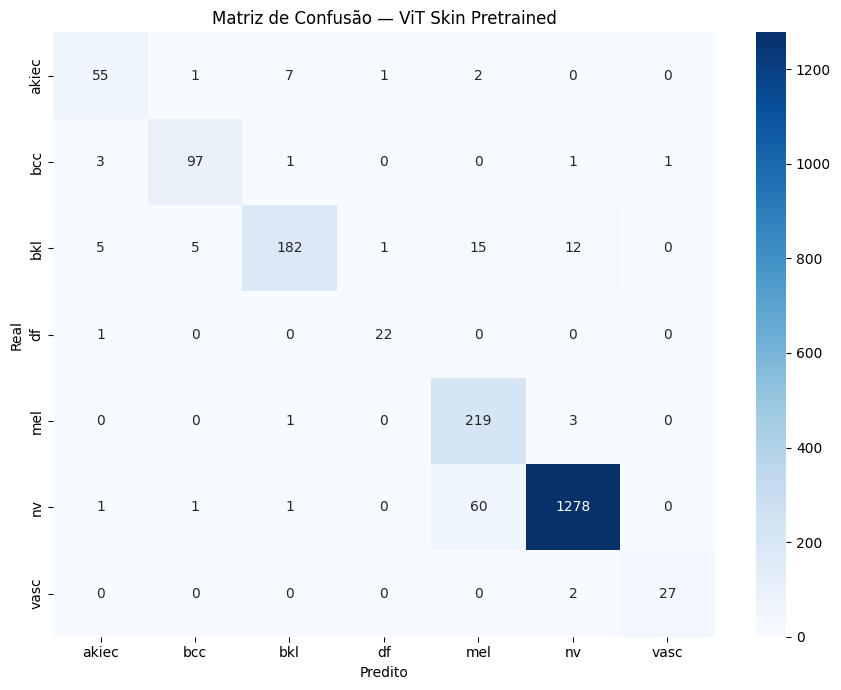

Matriz de confusão salva em: /content/drive/MyDrive/tcc_resultados4/confusao_ViT_Skin_Pretrained.png


In [ ]:
_, preds_cnn, labels_cnn = evaluate(model_cnn, val_loader)
_, preds_vit, labels_vit = evaluate(model_vit, val_loader)

save_metrics(labels_cnn, preds_cnn, train_dataset.classes, "DenseNet201 CNN")
save_metrics(labels_vit, preds_vit, train_dataset.classes, "ViT Skin Pretrained")

# 12. CURVAS DE APRENDIZADO

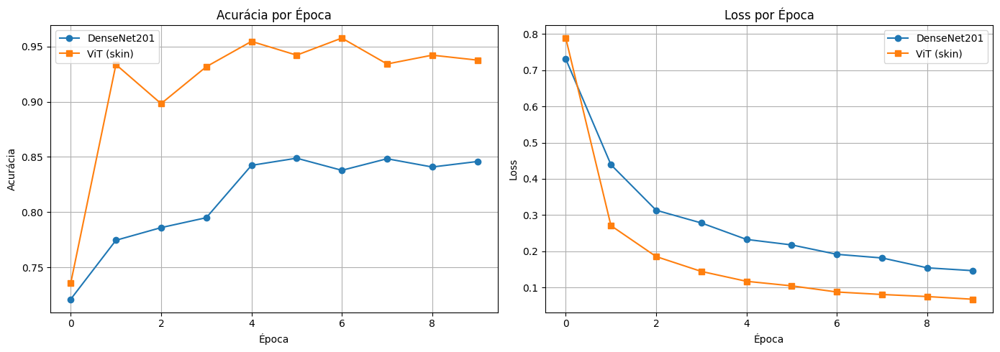

Curvas de aprendizado salvas em: /content/drive/MyDrive/tcc_resultados4/curvas_aprendizado.png


In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(history["cnn_acc"], label="DenseNet201", marker='o')
ax1.plot(history["vit_acc"], label="ViT (skin)",  marker='s')
ax1.set_xlabel("Época")
ax1.set_ylabel("Acurácia")
ax1.set_title("Acurácia por Época")
ax1.legend()
ax1.grid(True)

ax2.plot(history["cnn_loss"], label="DenseNet201", marker='o')
ax2.plot(history["vit_loss"], label="ViT (skin)",  marker='s')
ax2.set_xlabel("Época")
ax2.set_ylabel("Loss")
ax2.set_title("Loss por Época")
ax2.legend()
ax2.grid(True)

plt.tight_layout()
curves_path = f"{SAVE_DIR}/curvas_aprendizado.png"
plt.savefig(curves_path, dpi=150)
plt.show()
print(f"Curvas de aprendizado salvas em: {curves_path}")

# 13. GRAD-CAM (CNN)

In [ ]:
cam_extractor = GradCAM(model_cnn, target_layer='features.denseblock4.denselayer32.conv2')

def visualize_gradcam(image_path, save_path=None):
    model_cnn.eval()
    img = Image.open(image_path).convert('RGB')
    input_tensor = transform_val(img).unsqueeze(0).to(device)

    output     = model_cnn(input_tensor)
    class_idx  = output.argmax().item()
    class_name = train_dataset.classes[class_idx]

    activation_map = cam_extractor(class_idx, output)[0].squeeze().cpu().numpy()
    activation_map = Image.fromarray(activation_map).resize(img.size)
    activation_map = np.array(activation_map)
    activation_map = activation_map / activation_map.max()

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(img)
    ax[0].set_title("Imagem Original")
    ax[0].axis('off')

    ax[1].imshow(img)
    ax[1].imshow(activation_map, cmap='jet', alpha=0.5)
    ax[1].set_title(f"Grad-CAM — Predito: {class_name}")
    ax[1].axis('off')

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150)
        print(f"Grad-CAM salvo em: {save_path}")
    plt.show()

# 14. MAPA DE ATENÇÃO (ViT Skin) — Attention Rollout

In [ ]:
def visualize_vit_attention(image_path, save_path=None):
    model_vit.config._attn_implementation = "eager"
    model_vit.eval()
    img = Image.open(image_path).convert('RGB')
    input_tensor = transform_val(img).unsqueeze(0).to(device)

    output, attn_map = get_attention_rollout(model_vit, input_tensor)

    class_idx  = output.argmax().item()
    class_name = train_dataset.classes[class_idx]
    confidence = torch.softmax(output, dim=1)[0, class_idx].item()

    attn_img = Image.fromarray((attn_map * 255).astype(np.uint8)).resize(img.size, Image.BILINEAR)
    attn_np  = np.array(attn_img) / 255.0

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(img)
    ax[0].set_title("Imagem Original")
    ax[0].axis('off')

    ax[1].imshow(img)
    im = ax[1].imshow(attn_np, cmap='jet', alpha=0.5)
    ax[1].set_title(f"ViT Skin — Attention Rollout\nPredito: {class_name} ({confidence:.1%})")
    ax[1].axis('off')
    plt.colorbar(im, ax=ax[1], fraction=0.046, pad=0.04)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"Mapa de atenção ViT salvo em: {save_path}")
    plt.show()
    return attn_map, class_name, confidence

# 15. VISUALIZAR EXEMPLOS


Classe: akiec | Imagem: /content/dataset/val/akiec/ISIC_0030655.jpg
Grad-CAM salvo em: /content/drive/MyDrive/tcc_resultados4/gradcam/gradcam_akiec.png


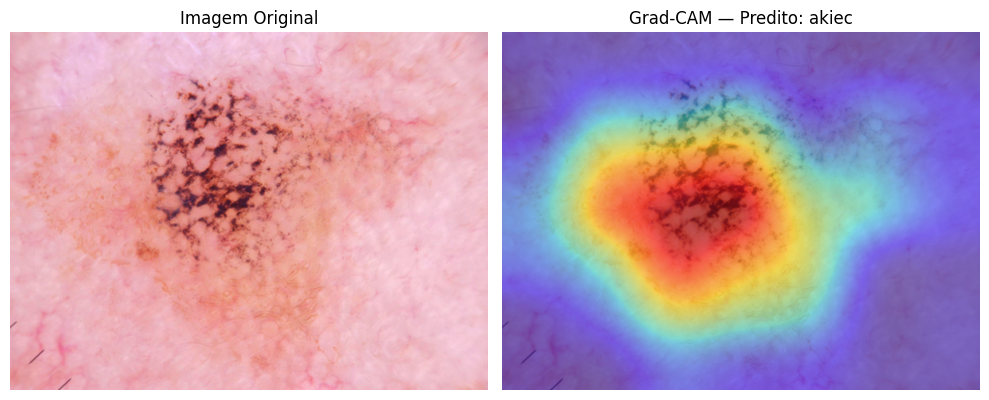

Mapa de atenção ViT salvo em: /content/drive/MyDrive/tcc_resultados4/vit_attn/vit_attn_akiec.png


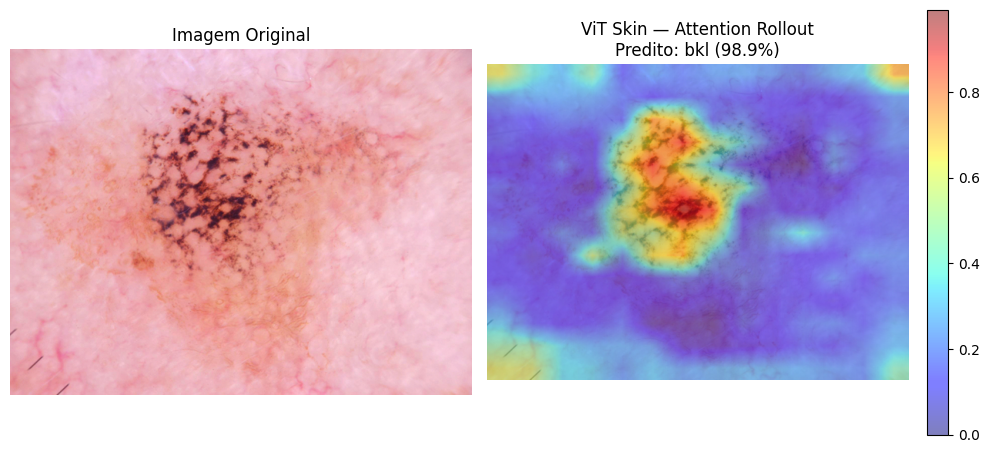


Classe: bkl | Imagem: /content/dataset/val/bkl/ISIC_0026644.jpg
Grad-CAM salvo em: /content/drive/MyDrive/tcc_resultados4/gradcam/gradcam_bkl.png


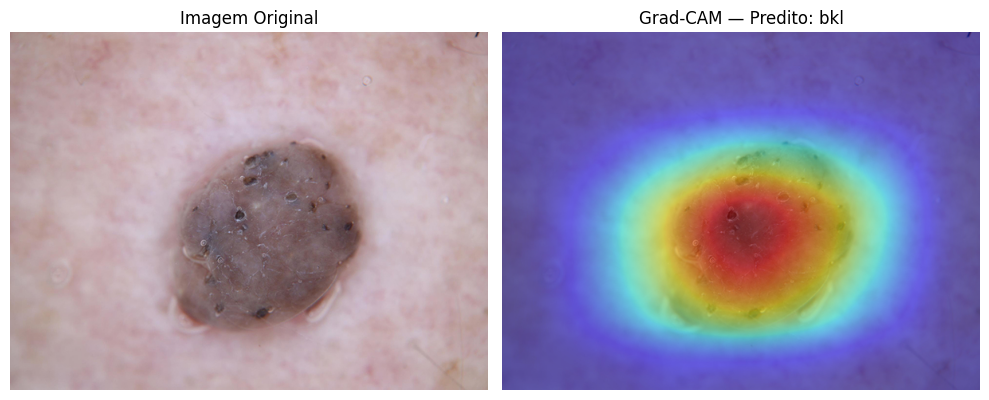

Mapa de atenção ViT salvo em: /content/drive/MyDrive/tcc_resultados4/vit_attn/vit_attn_bkl.png


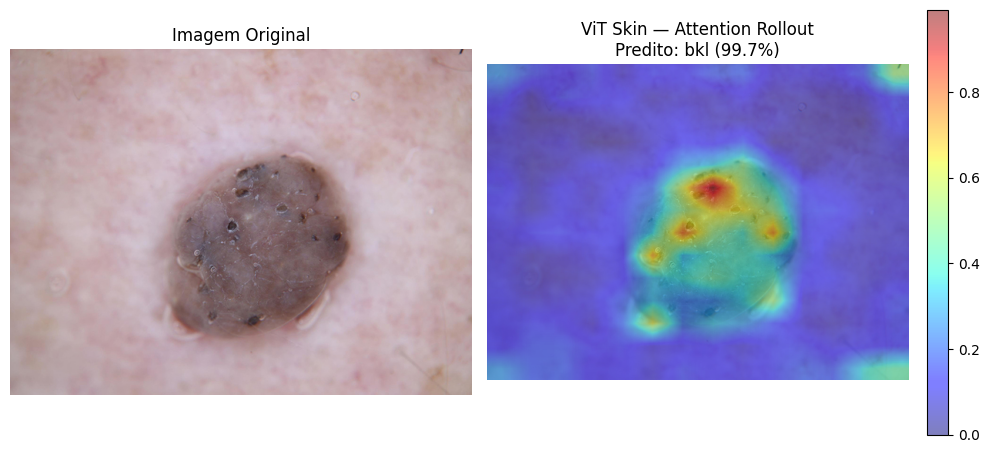


Classe: mel | Imagem: /content/dataset/val/mel/ISIC_0033804.jpg
Grad-CAM salvo em: /content/drive/MyDrive/tcc_resultados4/gradcam/gradcam_mel.png


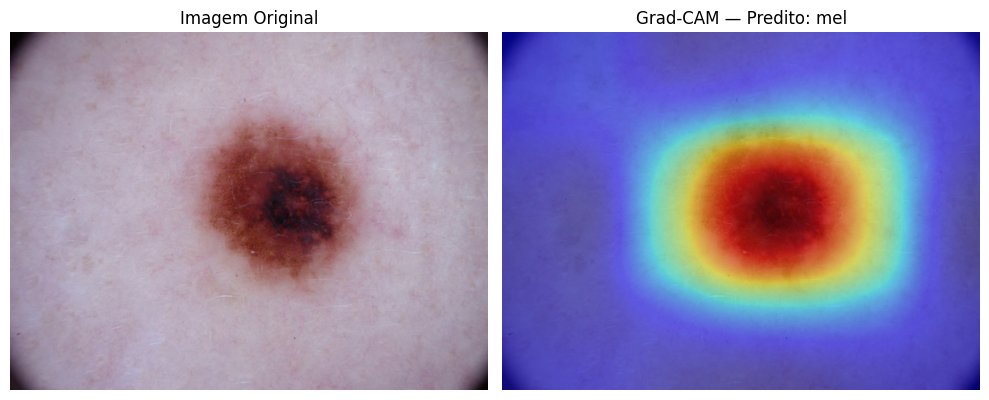

Mapa de atenção ViT salvo em: /content/drive/MyDrive/tcc_resultados4/vit_attn/vit_attn_mel.png


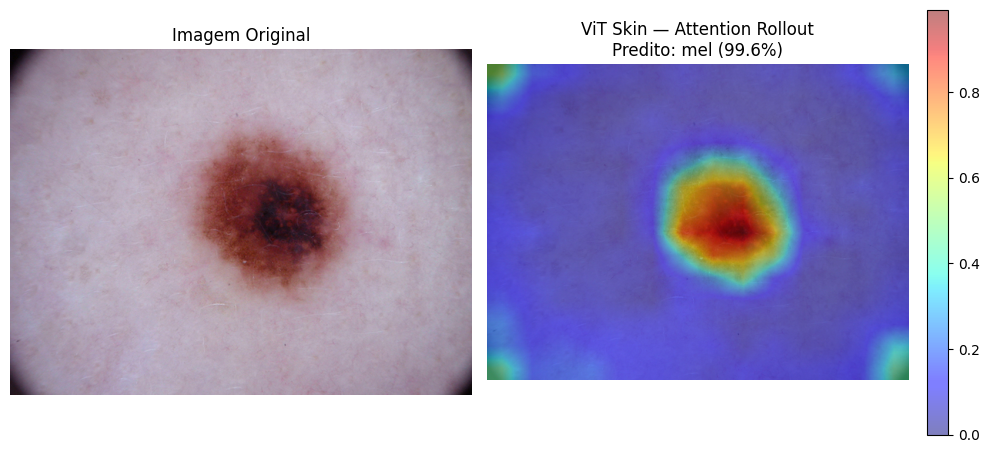


Classe: bcc | Imagem: /content/dataset/val/bcc/ISIC_0027722.jpg
Grad-CAM salvo em: /content/drive/MyDrive/tcc_resultados4/gradcam/gradcam_bcc.png


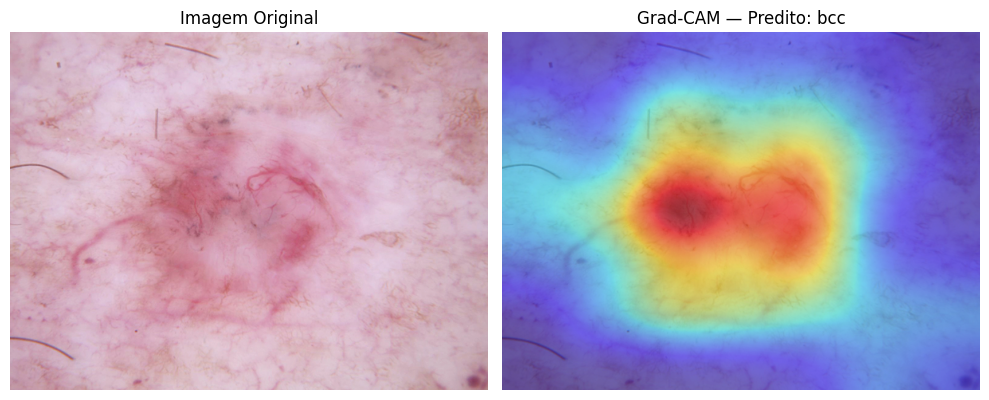

Mapa de atenção ViT salvo em: /content/drive/MyDrive/tcc_resultados4/vit_attn/vit_attn_bcc.png


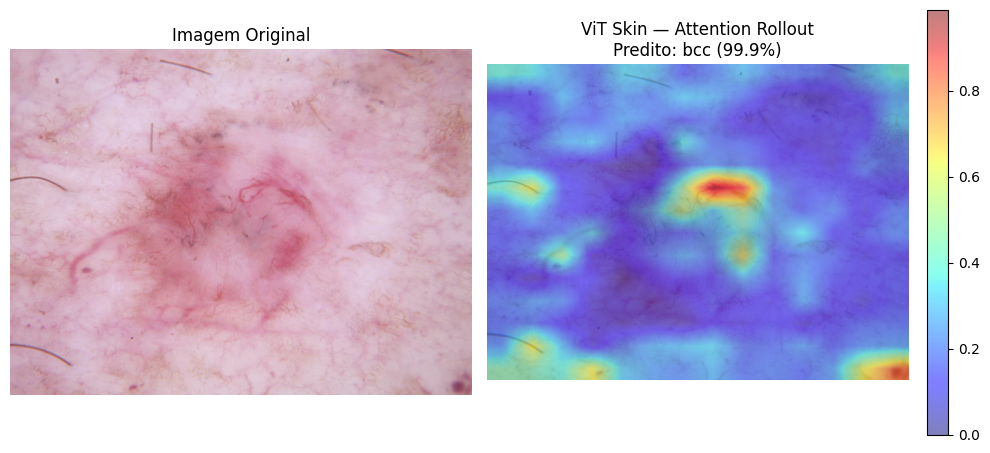


Classe: nv | Imagem: /content/dataset/val/nv/ISIC_0031402.jpg
Grad-CAM salvo em: /content/drive/MyDrive/tcc_resultados4/gradcam/gradcam_nv.png


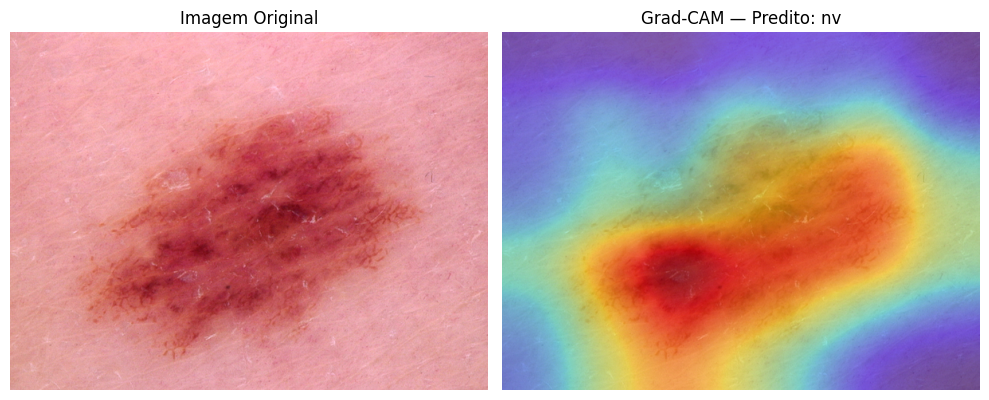

Mapa de atenção ViT salvo em: /content/drive/MyDrive/tcc_resultados4/vit_attn/vit_attn_nv.png


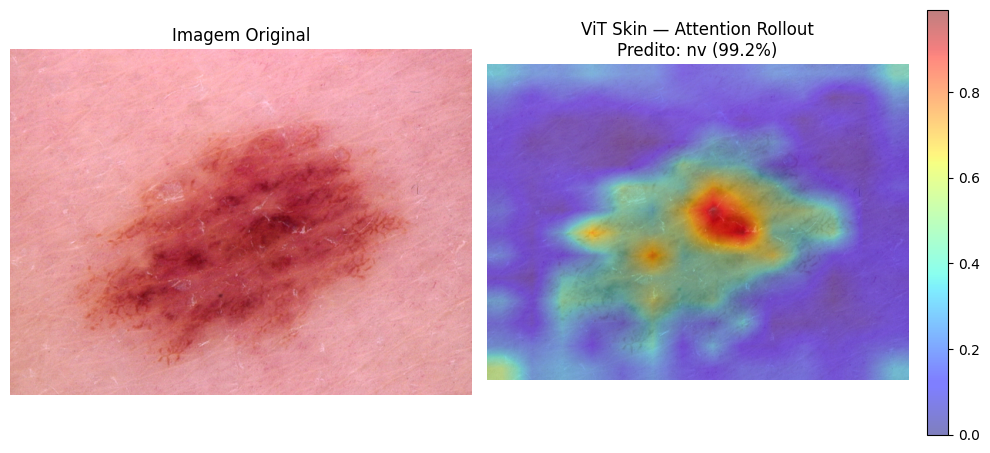


Classe: df | Imagem: /content/dataset/val/df/ISIC_0033808.jpg
Grad-CAM salvo em: /content/drive/MyDrive/tcc_resultados4/gradcam/gradcam_df.png


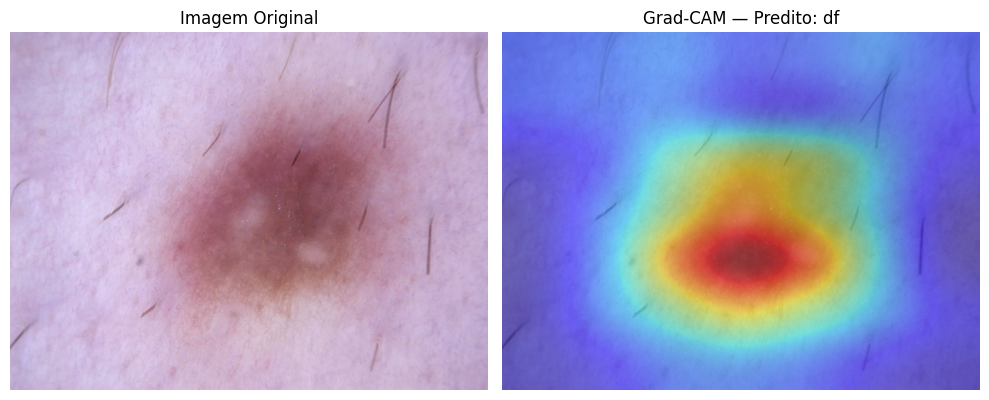

Mapa de atenção ViT salvo em: /content/drive/MyDrive/tcc_resultados4/vit_attn/vit_attn_df.png


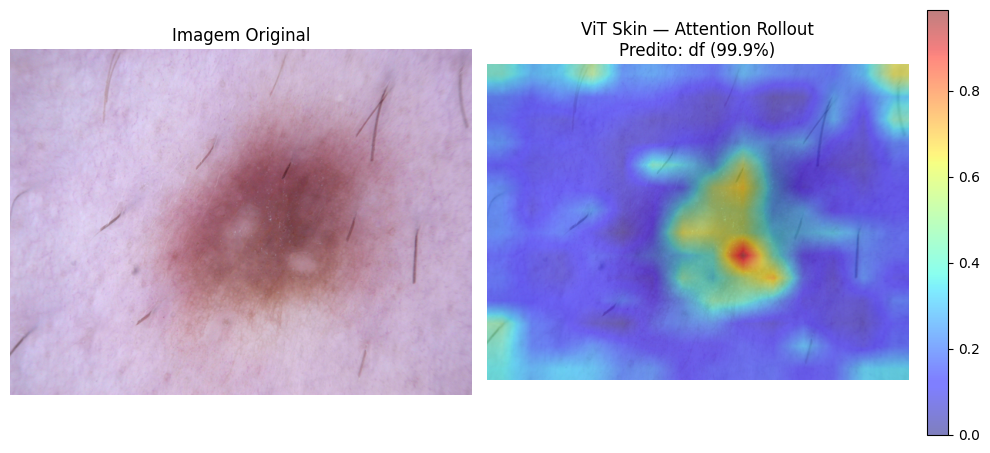


Classe: vasc | Imagem: /content/dataset/val/vasc/ISIC_0027385.jpg
Grad-CAM salvo em: /content/drive/MyDrive/tcc_resultados4/gradcam/gradcam_vasc.png


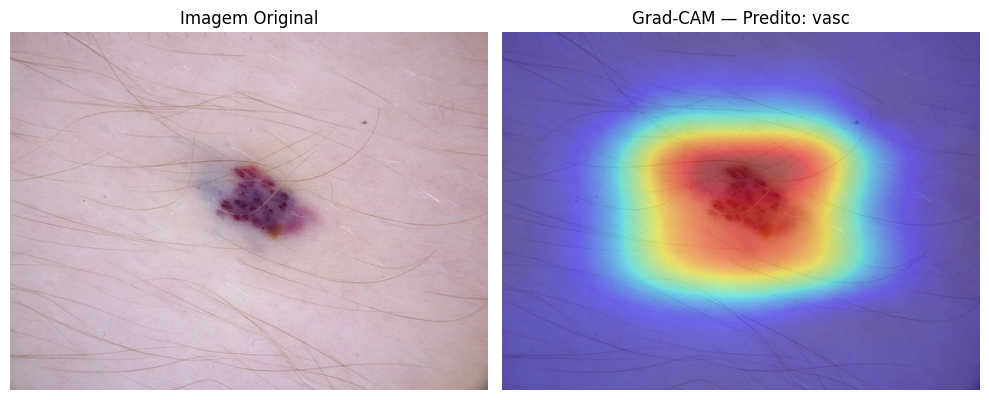

Mapa de atenção ViT salvo em: /content/drive/MyDrive/tcc_resultados4/vit_attn/vit_attn_vasc.png


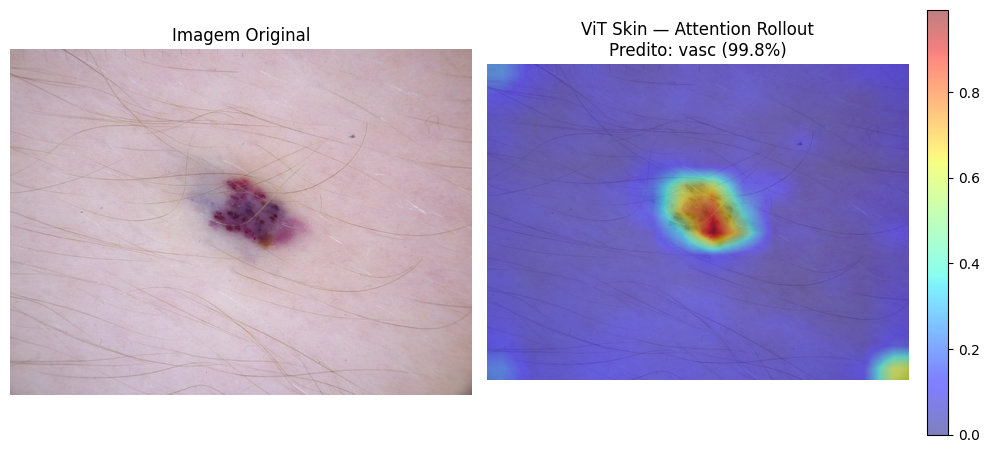


✅ Tudo salvo em: /content/drive/MyDrive/tcc_resultados4


In [ ]:
os.makedirs(f"{SAVE_DIR}/gradcam",  exist_ok=True)
os.makedirs(f"{SAVE_DIR}/vit_attn", exist_ok=True)

for classe in os.listdir(val_dir):
    imgs = os.listdir(f"{val_dir}/{classe}")
    if not imgs:
        continue
    image_path = f"{val_dir}/{classe}/{imgs[0]}"
    print(f"\nClasse: {classe} | Imagem: {image_path}")

    visualize_gradcam(
        image_path,
        save_path=f"{SAVE_DIR}/gradcam/gradcam_{classe}.png"
    )
    visualize_vit_attention(
        image_path,
        save_path=f"{SAVE_DIR}/vit_attn/vit_attn_{classe}.png"
    )

print(f"\n✅ Tudo salvo em: {SAVE_DIR}")

# 16. ANÁLISE QUANTITATIVA DOS MAPAS

In [ ]:
import cv2
from scipy.stats import spearmanr

def map_metrics(attn_map):
    flat = attn_map.flatten()
    flat = flat / (flat.sum() + 1e-8)
    threshold    = np.percentile(flat, 80)
    energy_top20 = flat[flat >= threshold].sum()
    eps          = 1e-8
    entropy      = -np.sum(flat * np.log(flat + eps))
    entropy_norm = entropy / np.log(len(flat))
    peak_ratio   = attn_map.max() / (attn_map.mean() + eps)
    return {"energy_top20": float(energy_top20),
            "entropy_norm": float(entropy_norm),
            "peak_ratio":   float(peak_ratio)}


def compute_iou_masks(map_a, map_b, threshold=0.5):
    bin_a        = (map_a >= threshold).astype(np.uint8)
    bin_b        = (map_b >= threshold).astype(np.uint8)
    intersection = (bin_a & bin_b).sum()
    union        = (bin_a | bin_b).sum()
    return intersection / (union + 1e-8)


results = []

for classe in os.listdir(val_dir):
    class_imgs = os.listdir(f"{val_dir}/{classe}")[:5]
    for img_name in class_imgs:
        image_path   = f"{val_dir}/{classe}/{img_name}"
        img          = Image.open(image_path).convert("RGB")
        input_tensor = transform_val(img).unsqueeze(0).to(device)

        model_cnn.eval()
        out_cnn   = model_cnn(input_tensor)
        cidx_cnn  = out_cnn.argmax().item()
        conf_cnn  = torch.softmax(out_cnn, dim=1)[0, cidx_cnn].item()
        gcam_raw  = cam_extractor(cidx_cnn, out_cnn)[0].squeeze().cpu().numpy()
        gcam_map  = np.array(Image.fromarray(gcam_raw).resize(img.size, Image.BILINEAR))
        gcam_map  = (gcam_map - gcam_map.min()) / (gcam_map.max() - gcam_map.min() + 1e-8)

        model_vit.eval()
        out_vit, attn_map = get_attention_rollout(model_vit, input_tensor)
        cidx_vit  = out_vit.argmax().item()
        conf_vit  = torch.softmax(out_vit, dim=1)[0, cidx_vit].item()
        attn_full = np.array(Image.fromarray((attn_map * 255).astype(np.uint8)).resize(img.size, Image.BILINEAR)) / 255.0

        m_cnn = map_metrics(gcam_map)
        m_vit = map_metrics(attn_full)
        iou   = compute_iou_masks(gcam_map, attn_full)
        rho, _ = spearmanr(gcam_map.flatten(), attn_full.flatten())

        results.append({
            "classe_real":   classe,
            "pred_cnn":      train_dataset.classes[cidx_cnn],
            "conf_cnn":      round(conf_cnn, 4),
            "pred_vit":      train_dataset.classes[cidx_vit],
            "conf_vit":      round(conf_vit, 4),
            "concordancia":  train_dataset.classes[cidx_cnn] == train_dataset.classes[cidx_vit],
            "gcam_energy20": round(m_cnn["energy_top20"], 4),
            "gcam_entropy":  round(m_cnn["entropy_norm"],  4),
            "gcam_peak":     round(m_cnn["peak_ratio"],    4),
            "vit_energy20":  round(m_vit["energy_top20"],  4),
            "vit_entropy":   round(m_vit["entropy_norm"],  4),
            "vit_peak":      round(m_vit["peak_ratio"],    4),
            "iou_mapas":     round(iou, 4),
            "spearman_rho":  round(rho, 4),
        })

df_analysis = pd.DataFrame(results)
print(df_analysis.to_string())
analysis_path = f"{SAVE_DIR}/analise_mapas.csv"
df_analysis.to_csv(analysis_path, index=False)
print(f"\nAnálise salva em: {analysis_path}")

   classe_real pred_cnn  conf_cnn pred_vit  conf_vit  concordancia  gcam_energy20  gcam_entropy  gcam_peak  vit_energy20  vit_entropy  vit_peak  iou_mapas  spearman_rho
0        akiec    akiec    0.7359      bkl    0.9887         False         0.5314        0.9604     3.6092        0.4314       0.9848    3.9705     0.2786       -0.0308
1        akiec    akiec    0.9992    akiec    0.9982          True         0.5720        0.9517     4.2595        0.3684       0.9906    5.0163     0.0000        0.0207
2        akiec    akiec    1.0000    akiec    0.9983          True         0.4980        0.9685     3.3800        0.3741       0.9890    3.6765     0.0344       -0.2501
3        akiec    akiec    0.9994    akiec    0.9963          True         0.6141        0.9480     4.2002        0.4243       0.9846    4.2874     0.3290        0.1245
4        akiec    akiec    0.7269      bkl    0.5278         False         0.5060        0.9643     3.5651        0.3336       0.9936    3.4192     0.0434 

# 17. COMPARAÇÃO VISUAL: GRAD-CAM vs ATTENTION ROLLOUT

Comparação salva em: /content/drive/MyDrive/tcc_resultados4/comparacao/compare_akiec.png


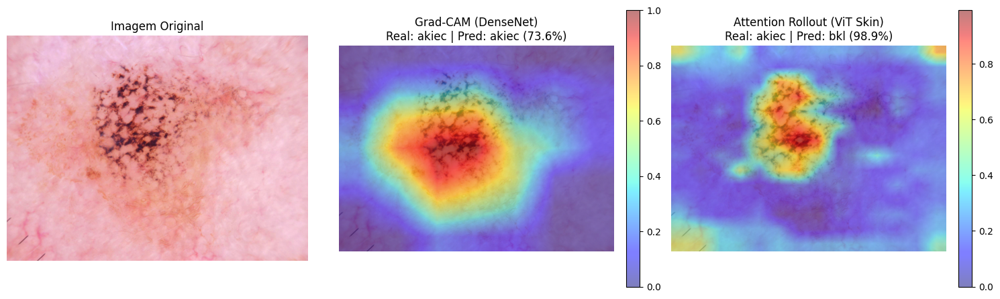

Comparação salva em: /content/drive/MyDrive/tcc_resultados4/comparacao/compare_bkl.png


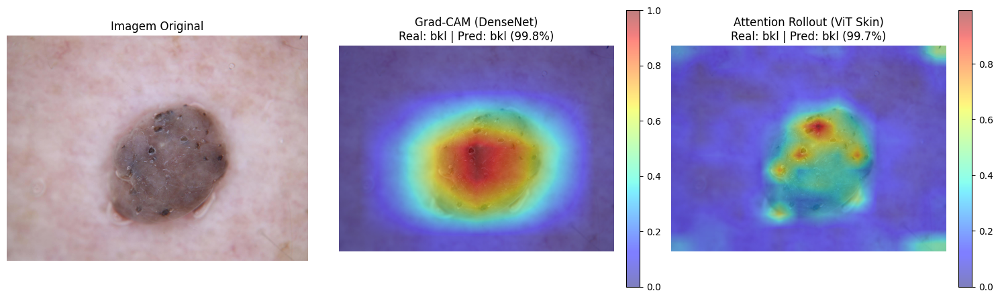

Comparação salva em: /content/drive/MyDrive/tcc_resultados4/comparacao/compare_mel.png


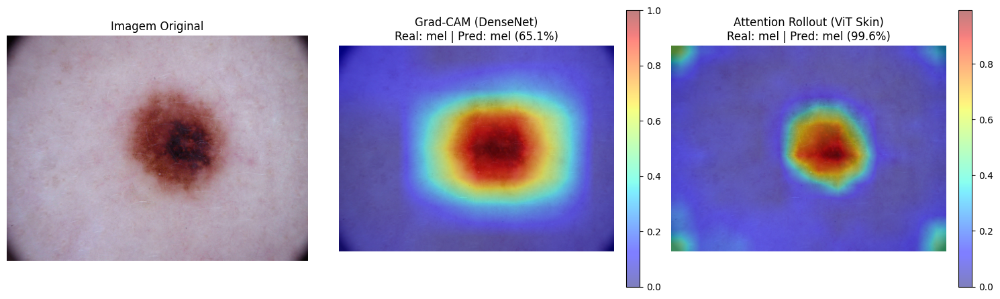

Comparação salva em: /content/drive/MyDrive/tcc_resultados4/comparacao/compare_bcc.png


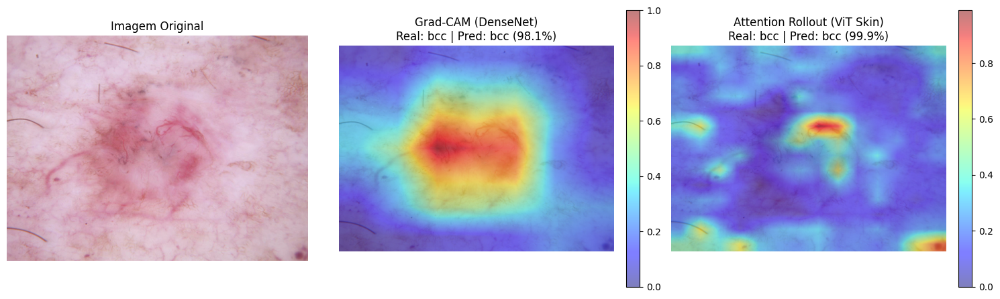

Comparação salva em: /content/drive/MyDrive/tcc_resultados4/comparacao/compare_nv.png


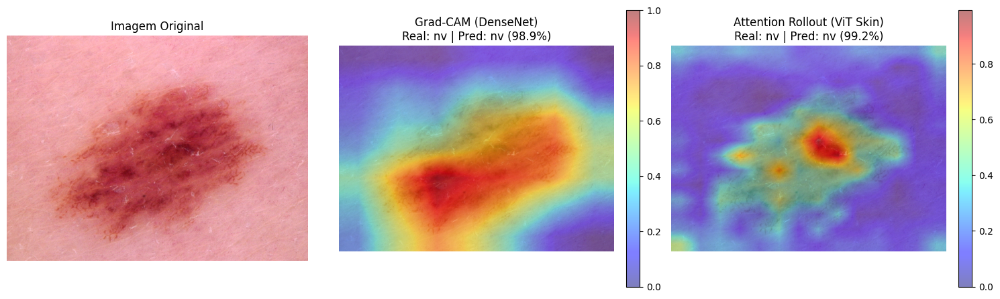

Comparação salva em: /content/drive/MyDrive/tcc_resultados4/comparacao/compare_df.png


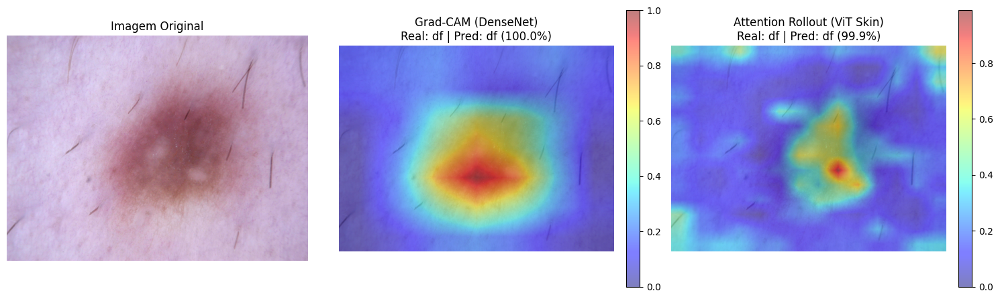

Comparação salva em: /content/drive/MyDrive/tcc_resultados4/comparacao/compare_vasc.png


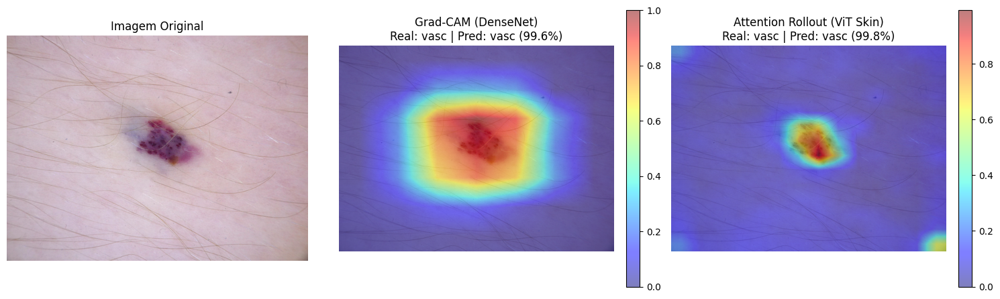

In [ ]:
def compare_maps(image_path, label=None, save_path=None):
    img          = Image.open(image_path).convert("RGB")
    input_tensor = transform_val(img).unsqueeze(0).to(device)

    model_cnn.eval()
    out_cnn  = model_cnn(input_tensor)
    cidx_cnn = out_cnn.argmax().item()
    conf_cnn = torch.softmax(out_cnn, dim=1)[0, cidx_cnn].item()
    gcam_raw = cam_extractor(cidx_cnn, out_cnn)[0].squeeze().cpu().numpy()
    gcam_map = np.array(Image.fromarray(gcam_raw).resize(img.size, Image.BILINEAR))
    gcam_map = (gcam_map - gcam_map.min()) / (gcam_map.max() - gcam_map.min() + 1e-8)

    model_vit.eval()
    out_vit, attn_map = get_attention_rollout(model_vit, input_tensor)
    cidx_vit  = out_vit.argmax().item()
    conf_vit  = torch.softmax(out_vit, dim=1)[0, cidx_vit].item()
    attn_full = np.array(Image.fromarray((attn_map * 255).astype(np.uint8)).resize(img.size, Image.BILINEAR)) / 255.0

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    title_prefix = f"Real: {label} | " if label else ""

    axes[0].imshow(img)
    axes[0].set_title("Imagem Original")
    axes[0].axis("off")

    axes[1].imshow(img)
    im1 = axes[1].imshow(gcam_map, cmap="jet", alpha=0.5)
    axes[1].set_title(f"Grad-CAM (DenseNet)\n{title_prefix}Pred: {train_dataset.classes[cidx_cnn]} ({conf_cnn:.1%})")
    axes[1].axis("off")
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    axes[2].imshow(img)
    im2 = axes[2].imshow(attn_full, cmap="jet", alpha=0.5)
    axes[2].set_title(f"Attention Rollout (ViT Skin)\n{title_prefix}Pred: {train_dataset.classes[cidx_vit]} ({conf_vit:.1%})")
    axes[2].axis("off")
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
        print(f"Comparação salva em: {save_path}")
    plt.show()

os.makedirs(f"{SAVE_DIR}/comparacao", exist_ok=True)

for classe in os.listdir(val_dir):
    imgs = os.listdir(f"{val_dir}/{classe}")
    if not imgs:
        continue
    compare_maps(
        f"{val_dir}/{classe}/{imgs[0]}",
        label=classe,
        save_path=f"{SAVE_DIR}/comparacao/compare_{classe}.png"
    )

# 18. RESUMO ESTATÍSTICO E BOXPLOTS

=== Resumo por Classe ===
             gcam_energy20  vit_energy20  gcam_entropy  vit_entropy  iou_mapas  spearman_rho
classe_real                                                                                 
akiec                0.544         0.386         0.959        0.989      0.137        -0.045
bcc                  0.614         0.429         0.947        0.981      0.183         0.012
bkl                  0.625         0.472         0.945        0.978      0.270         0.199
df                   0.523         0.388         0.963        0.988      0.123        -0.037
mel                  0.474         0.485         0.971        0.974      0.327         0.213
nv                   0.570         0.538         0.951        0.966      0.282         0.293
vasc                 0.597         0.559         0.947        0.962      0.280        -0.071

Resumo salvo em: /content/drive/MyDrive/tcc_resultados4/resumo_por_classe.csv


/tmp/ipykernel_6221/1395886680.py:26: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[2].boxplot([df_analysis["iou_mapas"], df_analysis["spearman_rho"]],


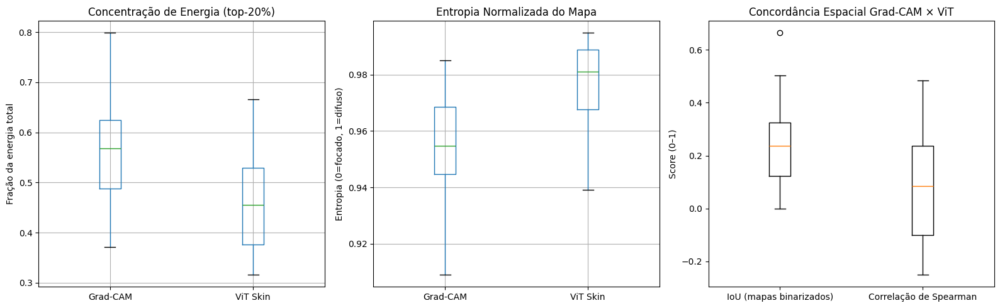

Boxplots salvos em: /content/drive/MyDrive/tcc_resultados4/boxplots_analise.png

CNN e ViT concordam em 31/35 imagens (88.6%)


In [ ]:
print("=== Resumo por Classe ===")
summary = df_analysis.groupby("classe_real")[
    ["gcam_energy20", "vit_energy20", "gcam_entropy", "vit_entropy",
     "iou_mapas", "spearman_rho"]
].mean().round(3)
print(summary.to_string())

summary_path = f"{SAVE_DIR}/resumo_por_classe.csv"
summary.to_csv(summary_path)
print(f"\nResumo salvo em: {summary_path}")

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

df_energy = pd.DataFrame({"Grad-CAM": df_analysis["gcam_energy20"],
                           "ViT Skin": df_analysis["vit_energy20"]})
df_energy.boxplot(ax=axes[0])
axes[0].set_title("Concentração de Energia (top-20%)")
axes[0].set_ylabel("Fração da energia total")

df_entr = pd.DataFrame({"Grad-CAM": df_analysis["gcam_entropy"],
                         "ViT Skin": df_analysis["vit_entropy"]})
df_entr.boxplot(ax=axes[1])
axes[1].set_title("Entropia Normalizada do Mapa")
axes[1].set_ylabel("Entropia (0=focado, 1=difuso)")

axes[2].boxplot([df_analysis["iou_mapas"], df_analysis["spearman_rho"]],
                labels=["IoU (mapas binarizados)", "Correlação de Spearman"])
axes[2].set_title("Concordância Espacial Grad-CAM × ViT")
axes[2].set_ylabel("Score (0–1)")

plt.tight_layout()
bp_path = f"{SAVE_DIR}/boxplots_analise.png"
plt.savefig(bp_path, dpi=150, bbox_inches="tight")
plt.show()
print(f"Boxplots salvos em: {bp_path}")

n_total    = len(df_analysis)
n_concorda = df_analysis["concordancia"].sum()
print(f"\nCNN e ViT concordam em {n_concorda}/{n_total} imagens ({n_concorda/n_total:.1%})")

In [ ]:
print(df_analysis.columns.tolist())

['classe_real', 'pred_cnn', 'conf_cnn', 'pred_vit', 'conf_vit', 'concordancia', 'gcam_energy20', 'gcam_entropy', 'gcam_peak', 'vit_energy20', 'vit_entropy', 'vit_peak', 'iou_mapas', 'spearman_rho']


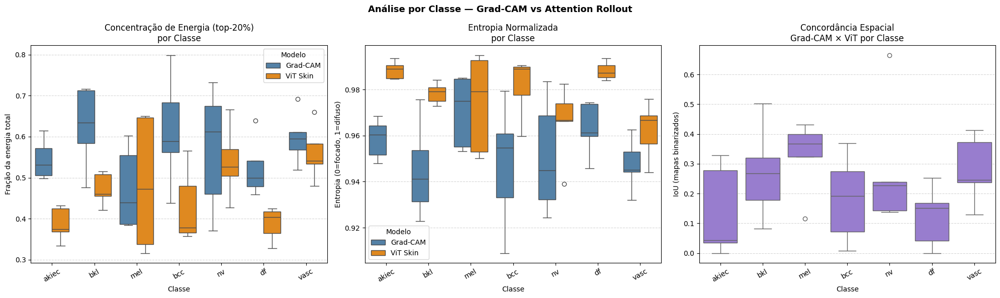

Salvo em: /content/drive/MyDrive/tcc_resultados4/boxplots_por_classe.png


In [ ]:
# ── Célula 18b — Boxplots por Classe ────────────────────────────────────────
import seaborn as sns

# Prepara dataframe no formato longo para o seaborn
df_long = pd.concat([
    df_analysis[["classe_real", "gcam_energy20", "gcam_entropy"]].rename(
        columns={"gcam_energy20": "energia", "gcam_entropy": "entropia"}
    ).assign(modelo="Grad-CAM"),
    df_analysis[["classe_real", "vit_energy20", "vit_entropy"]].rename(
        columns={"vit_energy20": "energia", "vit_entropy": "entropia"}
    ).assign(modelo="ViT Skin"),
])

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# --- Plot 1: Concentração de Energia por Classe ---
sns.boxplot(
    data=df_long, x="classe_real", y="energia",
    hue="modelo", palette=["steelblue", "darkorange"],
    ax=axes[0]
)
axes[0].set_title("Concentração de Energia (top-20%)\npor Classe")
axes[0].set_xlabel("Classe")
axes[0].set_ylabel("Fração da energia total")
axes[0].tick_params(axis='x', rotation=30)
axes[0].legend(title="Modelo")
axes[0].grid(axis="y", linestyle="--", alpha=0.5)

# --- Plot 2: Entropia por Classe ---
sns.boxplot(
    data=df_long, x="classe_real", y="entropia",
    hue="modelo", palette=["steelblue", "darkorange"],
    ax=axes[1]
)
axes[1].set_title("Entropia Normalizada\npor Classe")
axes[1].set_xlabel("Classe")
axes[1].set_ylabel("Entropia (0=focado, 1=difuso)")
axes[1].tick_params(axis='x', rotation=30)
axes[1].legend(title="Modelo")
axes[1].grid(axis="y", linestyle="--", alpha=0.5)

# --- Plot 3: Concordância IoU por Classe ---
sns.boxplot(
    data=df_analysis, x="classe_real", y="iou_mapas",
    color="mediumpurple", ax=axes[2]
)
axes[2].set_title("Concordância Espacial\nGrad-CAM × ViT por Classe")
axes[2].set_xlabel("Classe")
axes[2].set_ylabel("IoU (mapas binarizados)")
axes[2].tick_params(axis='x', rotation=30)
axes[2].grid(axis="y", linestyle="--", alpha=0.5)

plt.suptitle("Análise por Classe — Grad-CAM vs Attention Rollout",
             fontsize=13, fontweight='bold')
plt.tight_layout()

save_path = f"{SAVE_DIR}/boxplots_por_classe.png"
plt.savefig(save_path, dpi=150, bbox_inches="tight")
plt.show()
print(f"Salvo em: {save_path}")

# 19. DOWNLOAD SUBCONJUNTO ISIC 2018 (IMAGENS + MÁSCARAS GT)

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("tschandl/isic2018-challenge-task1-data-segmentation")

print("Path to dataset files:", path)

100%|██████████| 12.9G/12.9G [03:23<00:00, 68.0MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/tschandl/isic2018-challenge-task1-data-segmentation/versions/1


In [ ]:
import os
base = "/root/.cache/kagglehub/datasets/tschandl/isic2018-challenge-task1-data-segmentation/versions/1"
for root, dirs, files in os.walk(base):
    level = root.replace(base, '').count(os.sep)
    if level <= 2:
        print('  ' * level + os.path.basename(root) + '/')
        if level == 2:
            print('  ' * (level+1) + f"({len(files)} arquivos)")

1/
  ISIC2018_Task1_Training_GroundTruth/
  ISIC2018_Task1-2_Validation_Input/
    .ipynb_checkpoints/
      (4 arquivos)
  ISIC2018_Task1-2_Test_Input/
  ISIC2018_Task1-2_Training_Input/


In [ ]:
import os, glob
import numpy as np
import pandas as pd
from PIL import Image

BASE   = "/root/.cache/kagglehub/datasets/tschandl/isic2018-challenge-task1-data-segmentation/versions/1"
IMG_DIR  = f"{BASE}/ISIC2018_Task1-2_Training_Input"
MASK_DIR = f"{BASE}/ISIC2018_Task1_Training_GroundTruth"

N_IMAGES = 50

img_paths = sorted(glob.glob(f"{IMG_DIR}/ISIC_*.jpg"))[:N_IMAGES]
print(f"{len(img_paths)} imagens encontradas.")

downloaded = []
for img_path in img_paths:
    isic_id   = os.path.basename(img_path).replace(".jpg", "")
    mask_path = f"{MASK_DIR}/{isic_id}_segmentation.png"
    if os.path.exists(mask_path):
        downloaded.append({
            "isic_id":   isic_id,
            "img_path":  img_path,
            "mask_path": mask_path
        })

print(f"{len(downloaded)} pares imagem+máscara prontos.")

50 imagens encontradas.
50 pares imagem+máscara prontos.


# 20. IoU DOS MAPAS vs MÁSCARA GROUND-TRUTH

In [ ]:
# ── Célula 20 — IoU dos mapas vs Máscara Ground-Truth ──────────────────────

import os, glob, torch
import numpy as np
import pandas as pd
from PIL import Image
from torchvision import transforms

# Variáveis de ambiente (caso o kernel tenha sido reiniciado)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando: {device}")

# Garante que transform_val existe com os parâmetros corretos
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

# Verifica se os modelos estão carregados — se não, avisa
for var_name in ["model_cnn", "model_vit", "cam_extractor", "train_dataset"]:
    if var_name not in dir():
        print(f"⚠️  '{var_name}' não está definido. Rode as células 7, 8 e 13 antes desta.")

# ── Função de métricas ──────────────────────────────────────────────────────
def seg_metrics(pred_map, gt_mask, threshold=0.5):
    pred_bin  = (pred_map  >= threshold).astype(np.uint8)
    gt_bin    = (gt_mask   >= 128).astype(np.uint8)
    tp        = (pred_bin & gt_bin).sum()
    fp        = (pred_bin & (1 - gt_bin)).sum()
    fn        = ((1 - pred_bin) & gt_bin).sum()
    iou       = tp / (tp + fp + fn + 1e-8)
    precision = tp / (tp + fp + 1e-8)
    recall    = tp / (tp + fn + 1e-8)
    return float(iou), float(precision), float(recall)

# ── Loop principal ──────────────────────────────────────────────────────────
gt_results = []

for item in downloaded:
    try:
        img          = Image.open(item["img_path"]).convert("RGB")
        mask         = Image.open(item["mask_path"]).convert("L")
        input_tensor = transform_val(img).unsqueeze(0).to(device)

        model_cnn.eval()
        out_cnn  = model_cnn(input_tensor)
        cidx_cnn = out_cnn.argmax().item()
        conf_cnn = torch.softmax(out_cnn, dim=1)[0, cidx_cnn].item()
        gcam_raw = cam_extractor(cidx_cnn, out_cnn)[0].squeeze().cpu().numpy()
        gcam_map = np.array(Image.fromarray(gcam_raw).resize(img.size, Image.BILINEAR))
        gcam_map = (gcam_map - gcam_map.min()) / (gcam_map.max() - gcam_map.min() + 1e-8)

        model_vit.eval()
        out_vit, attn_map = get_attention_rollout(model_vit, input_tensor)
        cidx_vit  = out_vit.argmax().item()
        conf_vit  = torch.softmax(out_vit, dim=1)[0, cidx_vit].item()
        attn_full = np.array(Image.fromarray((attn_map * 255).astype(np.uint8)).resize(img.size, Image.BILINEAR)) / 255.0

        gt_np = np.array(mask.resize(img.size))

        iou_cnn, prec_cnn, rec_cnn = seg_metrics(gcam_map,  gt_np)
        iou_vit, prec_vit, rec_vit = seg_metrics(attn_full, gt_np)

        gt_results.append({
            "isic_id":  item["isic_id"],
            "pred_cnn": train_dataset.classes[cidx_cnn], "conf_cnn": round(conf_cnn, 4),
            "pred_vit": train_dataset.classes[cidx_vit], "conf_vit": round(conf_vit, 4),
            "iou_cnn":  round(iou_cnn,  4), "prec_cnn": round(prec_cnn, 4), "rec_cnn": round(rec_cnn, 4),
            "iou_vit":  round(iou_vit,  4), "prec_vit": round(prec_vit, 4), "rec_vit": round(rec_vit, 4),
        })
    except Exception as e:
        print(f"Erro em {item['isic_id']}: {e}")

# ── Resultados ──────────────────────────────────────────────────────────────
df_gt = pd.DataFrame(gt_results)
print(f"\n{len(df_gt)} imagens processadas com sucesso.")
print(df_gt[["isic_id","iou_cnn","prec_cnn","rec_cnn","iou_vit","prec_vit","rec_vit"]].to_string())

gt_path = f"{SAVE_DIR}/analise_gt_masks.csv"
df_gt.to_csv(gt_path, index=False)
print(f"\nAnálise GT salva em: {gt_path}")

print("\n=== Médias (subconjunto ISIC 2018) ===")
print(f"  Grad-CAM   — IoU: {df_gt.iou_cnn.mean():.3f} | Precision: {df_gt.prec_cnn.mean():.3f} | Recall: {df_gt.rec_cnn.mean():.3f}")
print(f"  ViT Skin   — IoU: {df_gt.iou_vit.mean():.3f} | Precision: {df_gt.prec_vit.mean():.3f} | Recall: {df_gt.rec_vit.mean():.3f}")

Usando: cuda

50 imagens processadas com sucesso.
         isic_id  iou_cnn  prec_cnn  rec_cnn  iou_vit  prec_vit  rec_vit
0   ISIC_0000000   0.6558    0.6734   0.9616   0.2796    0.6728   0.3236
1   ISIC_0000001   0.3868    0.3868   1.0000   0.8454    0.9110   0.9215
2   ISIC_0000003   0.6848    0.8345   0.7925   0.4927    0.9514   0.5054
3   ISIC_0000004   0.2526    0.7903   0.2707   0.4624    0.8501   0.5034
4   ISIC_0000006   0.4484    0.4495   0.9943   0.4702    1.0000   0.4702
5   ISIC_0000007   0.4146    0.4146   1.0000   0.4349    1.0000   0.4349
6   ISIC_0000008   0.4945    0.7455   0.5949   0.7589    0.9503   0.7903
7   ISIC_0000009   0.5609    0.6622   0.7856   0.4291    0.8962   0.4515
8   ISIC_0000011   0.7241    0.7742   0.9180   0.3952    0.9756   0.3991
9   ISIC_0000012   0.3286    0.3286   1.0000   0.6420    0.9836   0.6489
10  ISIC_0000013   0.8831    0.9219   0.9546   0.4558    0.9818   0.4597
11  ISIC_0000014   0.6710    0.9108   0.7182   0.1405    0.7447   0.1476
1

# 21. VISUALIZAÇÃO COM MÁSCARA GROUND-TRUTH

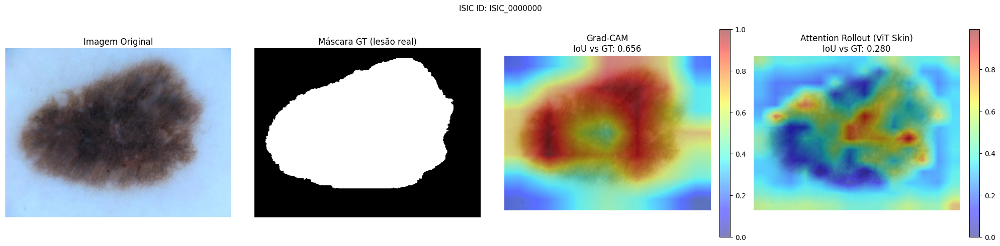

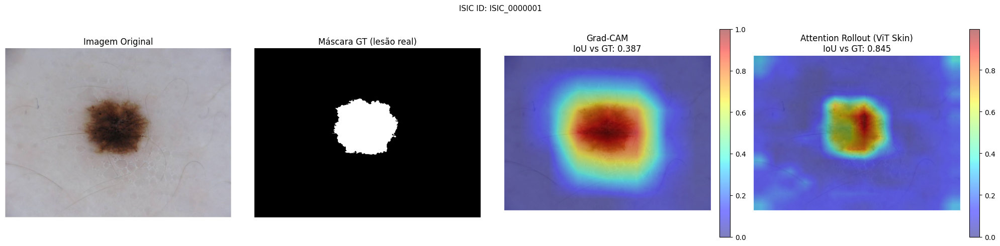

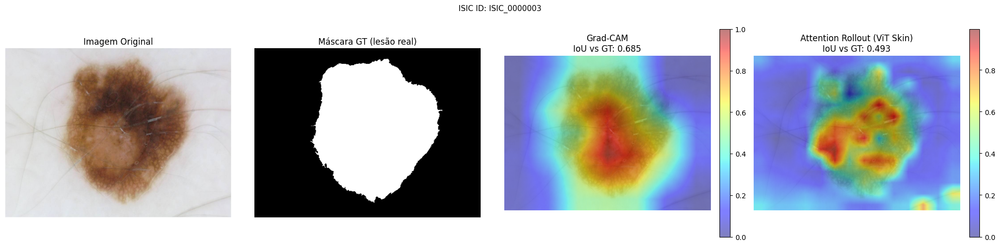

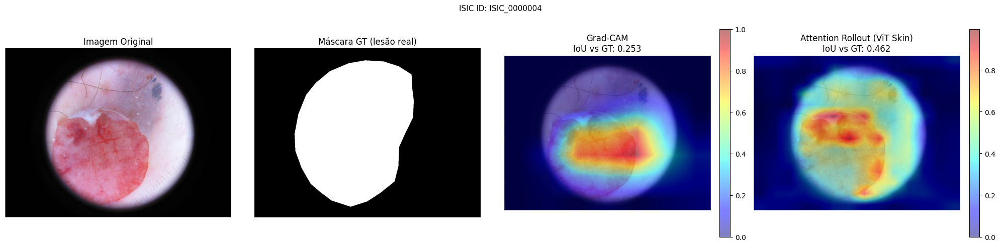

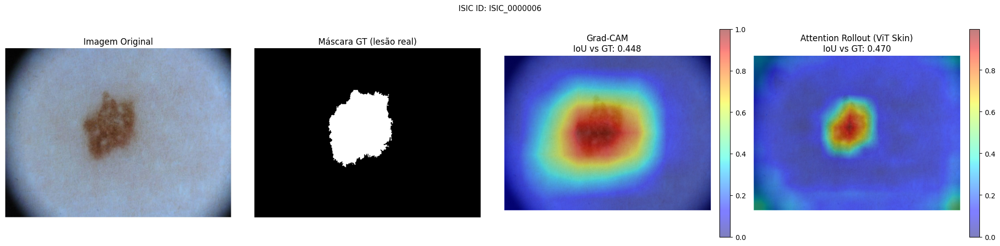

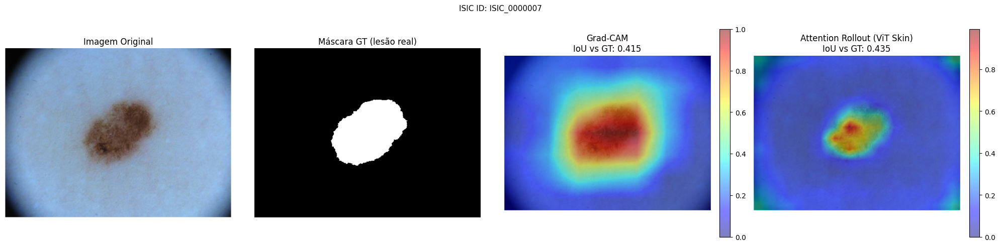

/tmp/ipykernel_6221/4116639717.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot([df_gt["iou_cnn"], df_gt["iou_vit"]],


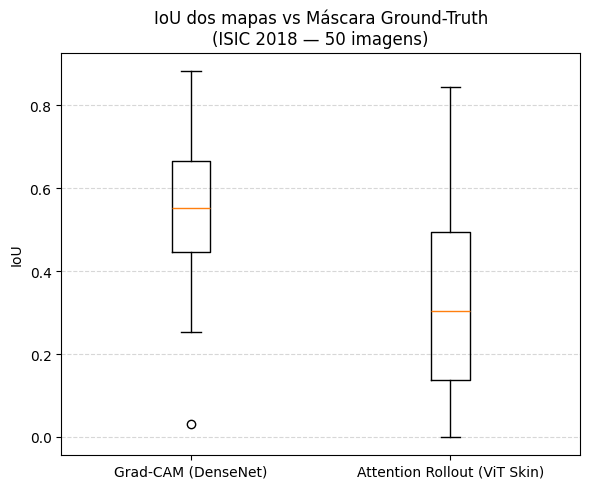

Boxplot salvo em: /content/drive/MyDrive/tcc_resultados4/boxplot_iou_gt.png


In [ ]:
os.makedirs(f"{SAVE_DIR}/validacao_gt", exist_ok=True)

def show_gt_comparison(item, save_path=None):
    img          = Image.open(item["img_path"]).convert("RGB")
    mask         = Image.open(item["mask_path"]).convert("L")
    input_tensor = transform_val(img).unsqueeze(0).to(device)

    model_cnn.eval()
    out_cnn  = model_cnn(input_tensor)
    cidx_cnn = out_cnn.argmax().item()
    gcam_raw = cam_extractor(cidx_cnn, out_cnn)[0].squeeze().cpu().numpy()
    gcam_map = np.array(Image.fromarray(gcam_raw).resize(img.size, Image.BILINEAR))
    gcam_map = (gcam_map - gcam_map.min()) / (gcam_map.max() - gcam_map.min() + 1e-8)

    model_vit.eval()
    _, attn_map = get_attention_rollout(model_vit, input_tensor)
    attn_full = np.array(Image.fromarray((attn_map * 255).astype(np.uint8)).resize(img.size, Image.BILINEAR)) / 255.0

    gt_np = np.array(mask.resize(img.size))

    iou_cnn, _, _ = seg_metrics(gcam_map,  gt_np)
    iou_vit, _, _ = seg_metrics(attn_full, gt_np)

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(img);                axes[0].set_title("Imagem Original");         axes[0].axis("off")
    axes[1].imshow(gt_np, cmap="gray"); axes[1].set_title("Máscara GT (lesão real)"); axes[1].axis("off")

    axes[2].imshow(img)
    im2 = axes[2].imshow(gcam_map, cmap="jet", alpha=0.5)
    axes[2].set_title(f"Grad-CAM\nIoU vs GT: {iou_cnn:.3f}")
    axes[2].axis("off")
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    axes[3].imshow(img)
    im3 = axes[3].imshow(attn_full, cmap="jet", alpha=0.5)
    axes[3].set_title(f"Attention Rollout (ViT Skin)\nIoU vs GT: {iou_vit:.3f}")
    axes[3].axis("off")
    plt.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04)

    plt.suptitle(f"ISIC ID: {item['isic_id']}", fontsize=11)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()

for item in downloaded[:6]:
    show_gt_comparison(item, save_path=f"{SAVE_DIR}/validacao_gt/{item['isic_id']}_gt_compare.png")

fig, ax = plt.subplots(figsize=(6, 5))
ax.boxplot([df_gt["iou_cnn"], df_gt["iou_vit"]],
           labels=["Grad-CAM (DenseNet)", "Attention Rollout (ViT Skin)"])
ax.set_title("IoU dos mapas vs Máscara Ground-Truth\n(ISIC 2018 — 50 imagens)")
ax.set_ylabel("IoU")
ax.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
boxplot_gt_path = f"{SAVE_DIR}/boxplot_iou_gt.png"
plt.savefig(boxplot_gt_path, dpi=150)
plt.show()
print(f"Boxplot salvo em: {boxplot_gt_path}")